In [ ]:
!pip install kaggle


In [1]:
from google.colab import files
import pandas as pd
import numpy as np
from google.colab import autoviz
import matplotlib.pyplot as plt

In [2]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rawatshubham09","key":"4bdc8fef6a26c53872d97f0fc8f3eca7"}'}

In [3]:
files.upload()

Saving model.h5 to model.h5


{'model.h5': b'\x89HDF\r\n\x1a\n\x00\x00\x00\x00\x00\x08\x08\x00\x04\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x10(4\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x01\x00\x06\x00\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x10\x00\x10\x00\x00\x00\x00\x00 \x03\x00\x00\x00\x00\x00\x00P\x01\x00\x00\x00\x00\x00\x00TREE\x00\x00\x01\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

In [4]:
!mkdir ~/.kaggle

In [5]:
!kaggle datasets download msambare/fer2013

Dataset URL: https://www.kaggle.com/datasets/msambare/fer2013
License(s): DbCL-1.0
 96% 58.0M/60.3M [00:03<00:00, 23.9MB/s]
100% 60.3M/60.3M [00:03<00:00, 17.1MB/s]


In [6]:
! unzip /content/fer2013.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/sad/Training_65242339.jpg  
  inflating: train/sad/Training_65267116.jpg  
  inflating: train/sad/Training_65275626.jpg  
  inflating: train/sad/Training_6529266.jpg  
  inflating: train/sad/Training_65329617.jpg  
  inflating: train/sad/Training_65338712.jpg  
  inflating: train/sad/Training_65338797.jpg  
  inflating: train/sad/Training_65387162.jpg  
  inflating: train/sad/Training_65404494.jpg  
  inflating: train/sad/Training_65426218.jpg  
  inflating: train/sad/Training_65430136.jpg  
  inflating: train/sad/Training_65437377.jpg  
  inflating: train/sad/Training_6545735.jpg  
  inflating: train/sad/Training_65463385.jpg  
  inflating: train/sad/Training_65473985.jpg  
  inflating: train/sad/Training_65502829.jpg  
  inflating: train/sad/Training_65505359.jpg  
  inflating: train/sad/Training_65508578.jpg  
  inflating: train/sad/Training_65516023.jpg  
  inflating: train/sad/Training_65524027.jpg  
  inflating

In [7]:
import os
dir_path = "/content/train/angry"
image_list = os.listdir(dir_path)
len(image_list)

3995

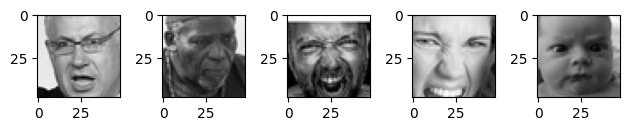

In [8]:
for i in range(1,6):
  fig = plt.subplot(1,5,i)
  img = plt.imread(os.path.join(dir_path,image_list[i]))
  fig.imshow(img,cmap="grey")
plt.tight_layout()

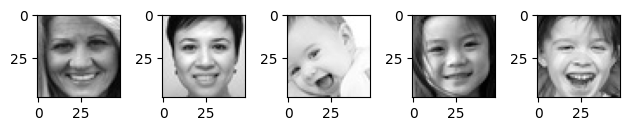

In [9]:
dir_path = "/content/train/happy"
image_list = os.listdir(dir_path)
for i in range(1,6):
  fig = plt.subplot(1,5,i)
  img = plt.imread(os.path.join(dir_path,image_list[i]))
  fig.imshow(img,cmap="grey")
plt.tight_layout()

In [ ]:
shape = plt.imread(os.path.join(dir_path,image_list[0])).shape
shape

(48, 48)

In [10]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 10.7 MB/s eta 0:00:00


In [11]:
import keras_tuner as kt
from tensorflow.keras.layers import Input, Conv2D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, MaxPool2D,Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [12]:
# Creating ImageDataGenerator object
imageGenTrain = ImageDataGenerator(
    zca_epsilon=1e-06,
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.2,
    zoom_range=0.2,
    channel_shift_range=0.2,
    fill_mode='nearest',
    vertical_flip=True,
    rescale=1./255,
    validation_split=0.2,
)

imageGenTest = ImageDataGenerator(
    rescale=1./255
    )

In [17]:
train_directory = "/content/train"
train = imageGenTrain.flow_from_directory(train_directory,
                        target_size=(48, 48),
                        color_mode='grayscale',
                        class_mode='categorical',
                        batch_size=32,
                        shuffle=True,
                        seed=42,
                        subset="training")

train_directory = "/content/train"
valid = imageGenTrain.flow_from_directory(train_directory,
                        target_size=(48, 48),
                        color_mode='grayscale',
                        class_mode='categorical',
                        batch_size=32,
                        shuffle=True,
                        seed=42,
                        subset="validation")
test_directory = "/content/test"

test = imageGenTest.flow_from_directory(
                        test_directory,
                        target_size=(48, 48),
                        color_mode='grayscale',
                        class_mode='categorical',
                        batch_size=32,
                        shuffle=False,
                        seed=42,
                        )

Found 22968 images belonging to 7 classes.
Found 5741 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


### Creating Model Using Keras Tuner

In [18]:
def model_maker(hp):
  model = Sequential()
  #Setting Input layer
  model.add(Input(shape=(48,48,1)))

  # This will select no. of Conv2D layers in model
  no_of_layers = hp.Int("num_layers1",min_value=1,max_value=6)

  # this will select the best no. of conv2d layers
  for i in range(no_of_layers):
    model.add(Conv2D(
        hp.Int("filter_"+str(i), min_value=20,max_value=60,step=5),
        kernel_size=(3,3),
        activation="relu")
    )
    model.add(Dropout(
        hp.Float("dropout_"+str(i), min_value=0.1, max_value=0.6, step=0.1))
    )
    #this will add Maxpooling layer after every 2 layers
    if i in [1,3]:
      model.add(MaxPool2D(strides=(1,1)))

  #this will flattern the tensor into 1D
  model.add(Flatten())
  no_of_layers = hp.Int("num_layers2",min_value=1,max_value=6)
  for i in range(no_of_layers):
    model.add(
                Dense(
                    units=hp.Int("units"+str(i), min_value=8, max_value=128, step=8),
                    activation=hp.Choice("Activation2"+str(i), values=["relu","tanh","sigmoid"])
                )
            )
    model.add(Dropout(
                rate=hp.Float('dropout2_' + str(4+i), min_value=0.1, max_value=0.5, step=0.1))
            )

  model.add(Dense(7,activation="softmax"))

  optimizer=hp.Choice("optimizer",values=["adam","rmsprop","adadelta","sgd","nadam"])
  model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
  return model

In [19]:
tuner = kt.RandomSearch(model_maker,
                       objective="val_accuracy",
                       max_trials=5,
                       directory="tuning",
                       project_name="final")

In [20]:
tuner.search(train,
             epochs=8,
             validation_data=(valid))

Trial 5 Complete [00h 05m 08s]
val_accuracy: 0.252917617559433

Best val_accuracy So Far: 0.27747780084609985
Total elapsed time: 00h 27m 28s


In [21]:
model = tuner.get_best_models(num_models=1)[0]
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 46, 46, 40)          │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 46, 46, 40)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 84640)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 104)                 │       8,802,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 104)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 7)                   │             735 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,803,799 (33.58 MB)

 Trainable params: 8,803,799 (33.58 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint_cb = ModelCheckpoint( 'model_checkpoint.keras', save_best_only=True, save_weights_only=False)
early_stopping = EarlyStopping( monitor='val_loss', patience=5, restore_best_weights=True )
history = model.fit(train, epochs=50, initial_epoch=5,
                    validation_data=(valid),
                    callbacks=[checkpoint_cb,early_stopping])

Epoch 6/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 34s 45ms/step - accuracy: 0.2591 - loss: 1.7721 - val_accuracy: 0.2555 - val_loss: 1.7788
Epoch 7/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.2745 - loss: 1.7641 - val_accuracy: 0.2766 - val_loss: 1.7618
Epoch 8/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.2716 - loss: 1.7657 - val_accuracy: 0.2728 - val_loss: 1.7607
Epoch 9/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.2688 - loss: 1.7578 - val_accuracy: 0.2522 - val_loss: 1.7874
Epoch 10/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - accuracy: 0.2757 - loss: 1.7598 - val_accuracy: 0.2646 - val_loss: 1.7982
Epoch 11/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - accuracy: 0.2760 - loss: 1.7568 - val_accuracy: 0.2756 - val_loss: 1.7552
Epoch 12/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - accuracy: 0.2775 - loss: 1.7491 - val_accuracy: 0.2853 - val_loss: 1.7548
Epoch 13/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step - accuracy: 0.2822 - loss: 1.748

In [ ]:
model.save("model.h5")

In [15]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model('model.h5')

In [24]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test)
print(f'Test Accuracy: {test_accuracy}')

 15/225 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.0903 - loss: 1.9743

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.2483 - loss: 1.8163
Test Accuracy: 0.3428531587123871


225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
              precision    recall  f1-score   support

       angry       0.36      0.09      0.14       958
     disgust       0.00      0.00      0.00       111
        fear       0.22      0.08      0.12      1024
       happy       0.36      0.73      0.48      1774
     neutral       0.35      0.24      0.29      1233
         sad       0.35      0.17      0.23      1247
    surprise       0.33      0.57      0.42       831

    accuracy                           0.34      7178
   macro avg       0.28      0.27      0.24      7178
weighted avg       0.33      0.34      0.29      7178



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


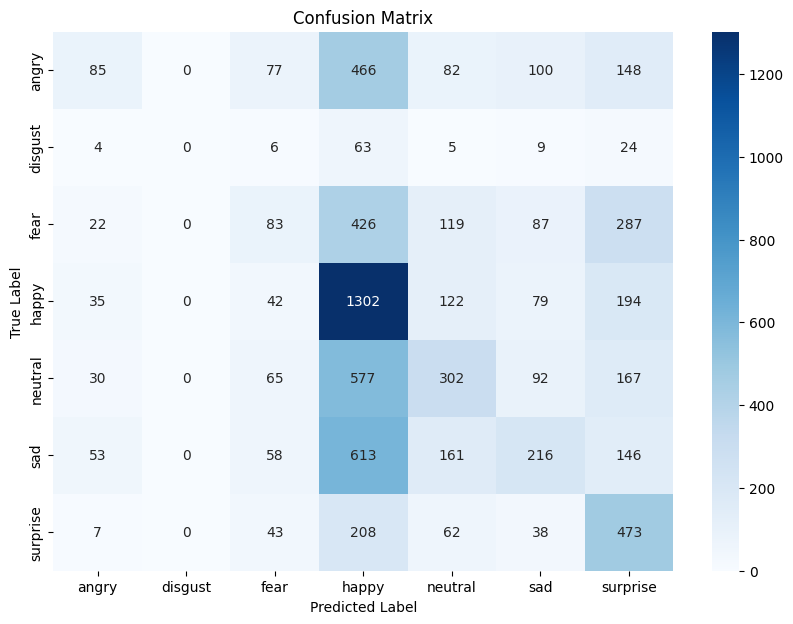

In [26]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

predictions = model.predict(test)
# Get the true labels
true_labels = test.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=test.class_indices.keys()))

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test.class_indices.keys(), yticklabels=test.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


- As we can see our model is not able to identify the faces.
- Now we are going to use transfer learning

### Trainning on EfficentNetB4 model

In [28]:
from tensorflow.keras.applications import EfficientNetB2

In [31]:
def build_model(hp):
  # adding Efficent net base model
  base_model = EfficientNetB2(weights="imagenet",include_top=False, input_shape=(48,48,3))
  # creating Sequential model
  model = Sequential()
  model.add(base_model)
  model.add(Flatten())
  # useing keras-tunner for predicting no. of dense layers
  no_of_layer = hp.Int("no_of_layers",min_value=1,max_value=3,step=1)

  for i in range(no_of_layer):
    model.add(Dense(
        units=hp.Int("unit_"+str(i), min_value=32,max_value=128,step=8),
        activation=hp.Choice("Activation2"+str(i), values=["relu","tanh","sigmoid"])))
    model.add(Dropout(hp.Float("dropout_"+str(i), min_value=0.1, max_value=0.6, step=0.1)))

  model.add(Dense(units=7,activation="softmax"))

  optimizer=hp.Choice("optimizer",values=["adam","rmsprop","adadelta","sgd","nadam"])
  model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

  return model

In [32]:
from keras_tuner import HyperModel, BayesianOptimization
tunner = BayesianOptimization(build_model,
                              objective="val_accuracy",
                              max_trials=6,
                              executions_per_trial=2,
                              directory="my_dir",
                              project_name="bayesian_optimization")
tuner.search(train, validation_data=valid, epochs=5)

In [33]:
# getting best hyper parameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

In [34]:
#building best model
best_model = tuner.hypermodel.build(best_hyperparameters)
best_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 46, 46, 40)          │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 46, 46, 40)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 84640)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 104)                 │       8,802,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 104)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 7)                   │             735 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,803,799 (33.58 MB)

 Trainable params: 8,803,799 (33.58 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
checkpoint_cb = ModelCheckpoint( 'model_checkpoint_efficentnet.keras', save_best_only=True, save_weights_only=False)
early_stopping = EarlyStopping( monitor='val_loss', patience=5, restore_best_weights=True,min_delta=0.05)
history = model.fit(train, epochs=50, initial_epoch=5,
                    validation_data=(valid),
                    callbacks=[checkpoint_cb,early_stopping])

Epoch 6/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.2991 - loss: 1.7359 - val_accuracy: 0.3041 - val_loss: 1.7296
Epoch 7/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.2995 - loss: 1.7303 - val_accuracy: 0.3008 - val_loss: 1.7356
Epoch 8/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - accuracy: 0.3018 - loss: 1.7219 - val_accuracy: 0.2970 - val_loss: 1.7335
Epoch 9/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 36s 39ms/step - accuracy: 0.3024 - loss: 1.7225 - val_accuracy: 0.3047 - val_loss: 1.7258
Epoch 10/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.3032 - loss: 1.7260 - val_accuracy: 0.3041 - val_loss: 1.7277
Epoch 11/50
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.3031 - loss: 1.7273 - val_accuracy: 0.3101 - val_loss: 1.7216


225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step
              precision    recall  f1-score   support

       angry       0.38      0.07      0.12       958
     disgust       0.00      0.00      0.00       111
        fear       0.25      0.05      0.09      1024
       happy       0.33      0.80      0.47      1774
     neutral       0.33      0.25      0.29      1233
         sad       0.35      0.17      0.23      1247
    surprise       0.38      0.44      0.41       831

    accuracy                           0.34      7178
   macro avg       0.29      0.26      0.23      7178
weighted avg       0.33      0.34      0.28      7178



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


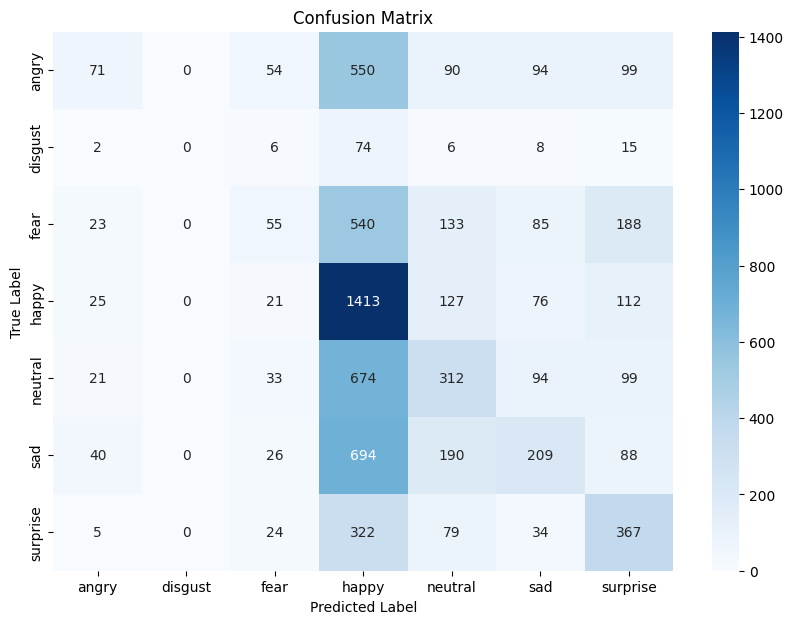

In [36]:
predictions = model.predict(test)
# Get the true labels
true_labels = test.classes

# Get the predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=test.class_indices.keys()))

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test.class_indices.keys(), yticklabels=test.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
